# 0. Import Libraries
Please make sure these libraries below are installed in your computer before runnnign this script

In [1]:
# 0. Import

import numpy as np
import pandas as pd
import os
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style("ticks")

In [2]:
plt.rcParams["figure.figsize"] = [18,9]
%config InlineBackend.figure_format = 'retina'
sns.set_style("ticks")
plt.rcParams["image.cmap"] = "viridis"

In [4]:
import IQC

# 1. Check data
## !! Please enter file path

In [5]:
folder = "./test_data/"

In [6]:
file_paths = os.listdir(folder)
file_paths.sort()
file_paths = [os.path.join(folder, i) for i in file_paths if not "DS_Store" in i]
file_paths

['./test_data/control1_bf.JPG',
 './test_data/control1_gfp.JPG',
 './test_data/control2_bf.JPG',
 './test_data/control2_gfp.JPG',
 './test_data/sample1_bf.JPG',
 './test_data/sample1_gfp.JPG',
 './test_data/sample2_bf.JPG',
 './test_data/sample2_gfp.JPG',
 './test_data/sample3_bf.JPG',
 './test_data/sample3_gfp.JPG',
 './test_data/sample4_bf.JPG',
 './test_data/sample4_gfp.JPG']

In [7]:
BF_path_list = [i for i in file_paths if "bf" in i]
GFP_path_list = [i for i in file_paths if "gfp" in i]

print(BF_path_list)
print(GFP_path_list)

['./test_data/control1_bf.JPG', './test_data/control2_bf.JPG', './test_data/sample1_bf.JPG', './test_data/sample2_bf.JPG', './test_data/sample3_bf.JPG', './test_data/sample4_bf.JPG']
['./test_data/control1_gfp.JPG', './test_data/control2_gfp.JPG', './test_data/sample1_gfp.JPG', './test_data/sample2_gfp.JPG', './test_data/sample3_gfp.JPG', './test_data/sample4_gfp.JPG']


In [8]:
## Step 1 
# 1.0 set file path

BF_file = BF_path_list[2]
GFP_file =GFP_path_list[2]

print(BF_file, GFP_file)

./test_data/sample1_bf.JPG ./test_data/sample1_gfp.JPG


In [9]:
from importlib import reload

In [10]:

reload(IQC)
img = IQC.OneArea()
img.getBFImageFromPath(BF_file, plot=False)
img.getGreenImageFromPath(GFP_file, plot=False)


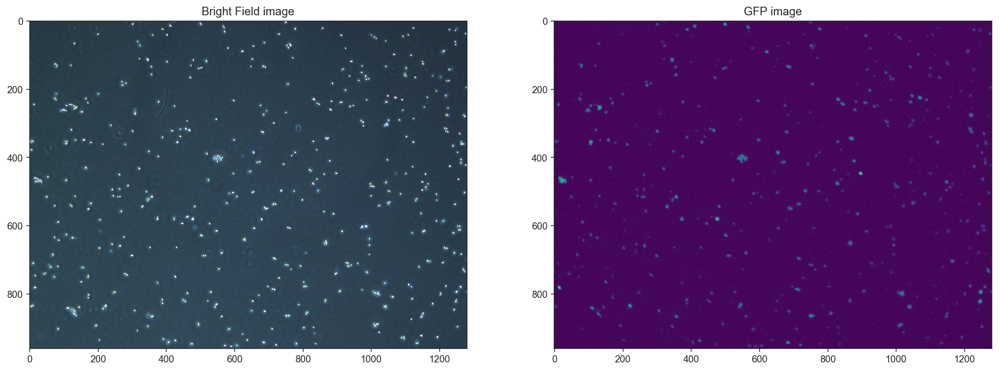

In [11]:
# 1.2.1 show image

plt.subplot(1,2,1)
img.plotBF()
plt.title("Bright Field image")

plt.subplot(1,2,2)
img.plotGreen()
plt.title("GFP image")
plt.show()


# 2. Object detection

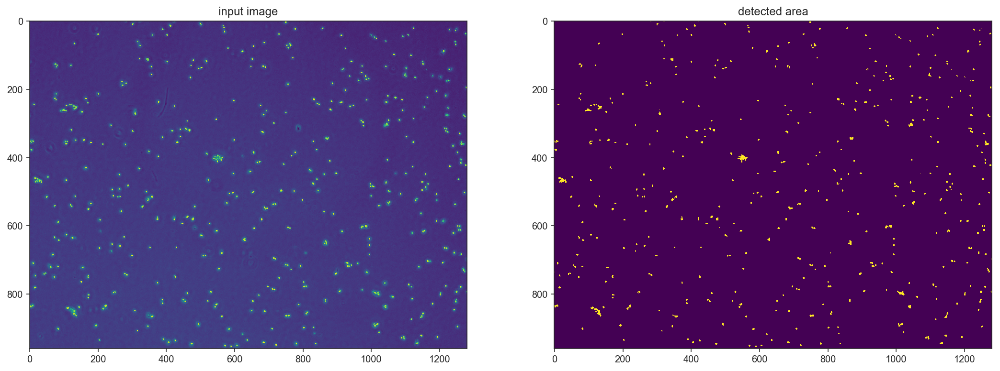

In [12]:

# 2.1 Binalization by Otsu methoda
color_for_cell_detection = "BF"
threshold_adjustment = 0
img.binarizeImageByOtsu(color=color_for_cell_detection,
                        threshold_adjustment=threshold_adjustment, plot=True)

# !! Please enter threshold value

 if Binalization did not work, please try binarize again with new parameter for "threshold_adjustment"


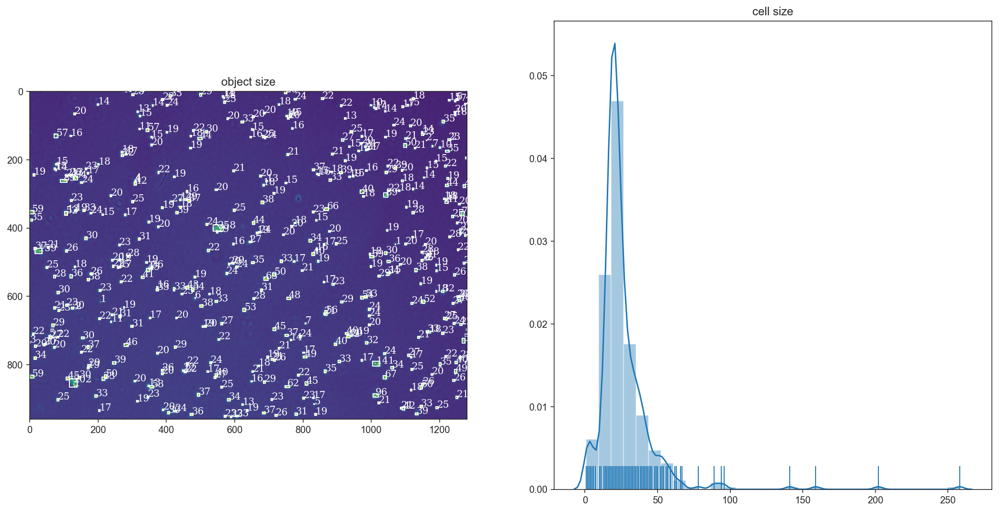

In [13]:
# 2.2 Object detection
segmentation_scale = 1
img.detectObjects(color=color_for_cell_detection,
                  segmentation_scale=segmentation_scale)

if objects are not properly detected, please change "segmentation_scale" and try object detection again
In many case, detected objects include debris and doublet cells. We have to remove these debris and doublet cells before quantification.


# 3. Filtering


## !! Please set parameters for filtering
filtering is needed to remove aggregated cells and debris.
the values below should be changed depending on cell size distribution above.


In [14]:
min_size = 10
max_size = 70

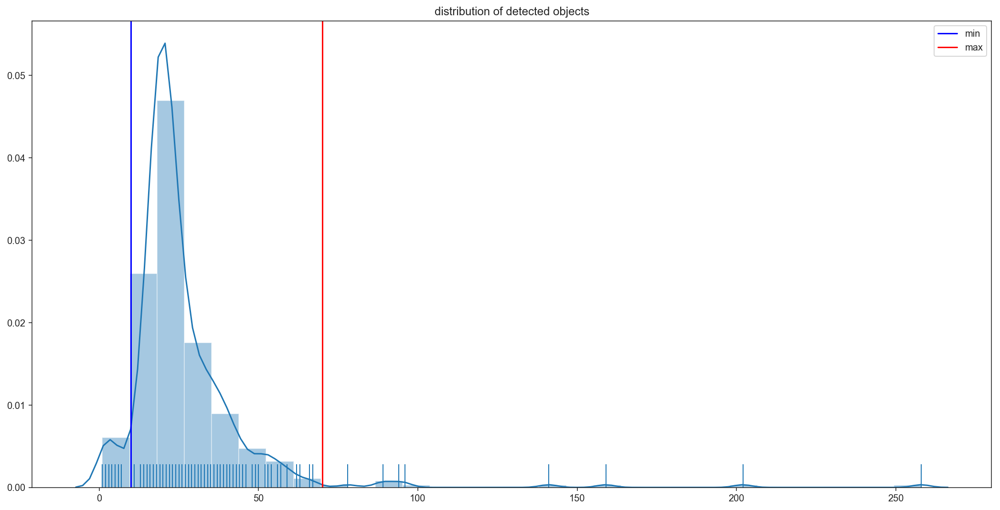

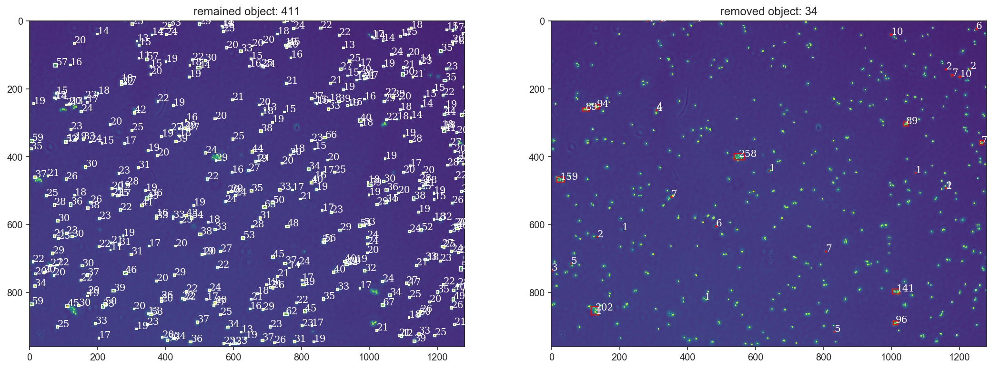

In [15]:
img.filterObjectsBySize(color=color_for_cell_detection, 
                        min_size=min_size, max_size=max_size, plot=True)

If the cells are not appropriately identified, go back and change parameters for thresholding

## 4. Get signal intensity

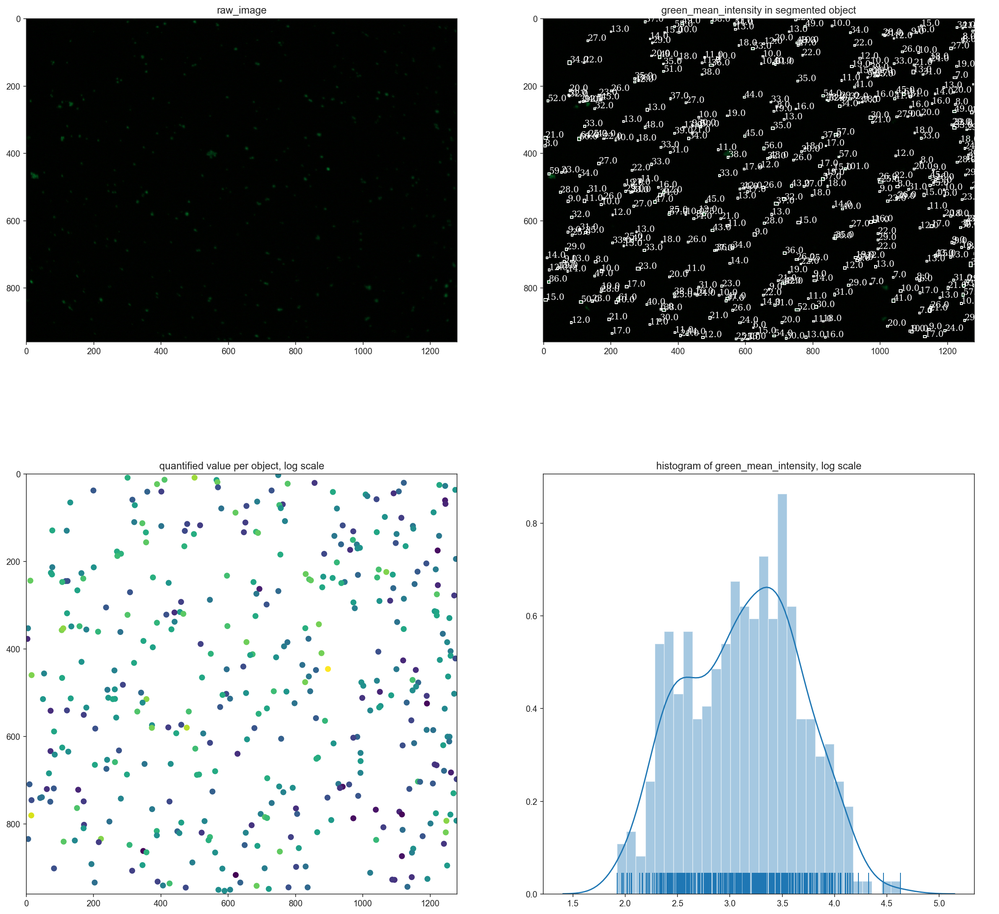

In [16]:
img.plotValuesPerObjects(segment_color=color_for_cell_detection,
                         value="green_mean_intensity", scale_log=True)

In [17]:
result = img.getAllValuesPerObjects(color_for_cell_detection, remove_noise=True)

In [18]:
result.head()

,cordinates_y,cordinates_x,area,binarize_threshold_adjustment_otsu,binarize_threshold_value,green_mean_intensity,green_mean_intensity_log1p,segmentation_scale_factor,number_of_all_objects,cell_size_filter_min,cell_size_filter_max,number_of_removed_object,number_of_remained_object
3,2.346154,748.538462,26,0,0.520663,21.807692,3.127098,1,445,10,70,34,411
4,8.103448,499.965517,29,0,0.520663,67.620690,4.228594,1,445,10,70,34,411
5,8.280000,301.000000,25,0,0.520663,36.760000,3.631250,1,445,10,70,34,411
6,12.969697,410.757576,33,0,0.520663,48.515152,3.902279,1,445,10,70,34,411
7,13.500000,565.285714,14,0,0.520663,31.142857,3.470190,1,445,10,70,34,411


# 5. Process all images
If you have some images, quantification can be done in the same way with the parameters acquired by the pilot analysis below.

In [19]:
# make function for the pipeline
def processAll(file_path_for_BF, file_path_for_GFP):
    print(f"BF image: {file_path_for_BF}")
    print(f"GFP image: {file_path_for_GFP}")
    img_ = IQC.OneArea()
    img_.getBFImageFromPath(file_path_for_BF, plot=False)
    img_.getGreenImageFromPath(file_path_for_GFP, plot=False)
    
    img_.binarizeImageByOtsu(color=color_for_cell_detection,
                       threshold_adjustment=threshold_adjustment,
                       plot=False)
    img_.detectObjects(color="BF", segmentation_scale=segmentation_scale,
                       plot=False)
    
    img_.filterObjectsBySize(color=color_for_cell_detection,
                             min_size=min_size,
                             max_size=max_size,
                             plot=True)
    plt.show()
    
    res = img_.getAllValuesPerObjects(segment_color=color_for_cell_detection)
    res["file_path_BF"] = file_path_for_BF
    res["file_path_Green"] = file_path_for_GFP
    
    return res

BF image: ./test_data/control1_bf.JPG
GFP image: ./test_data/control1_gfp.JPG


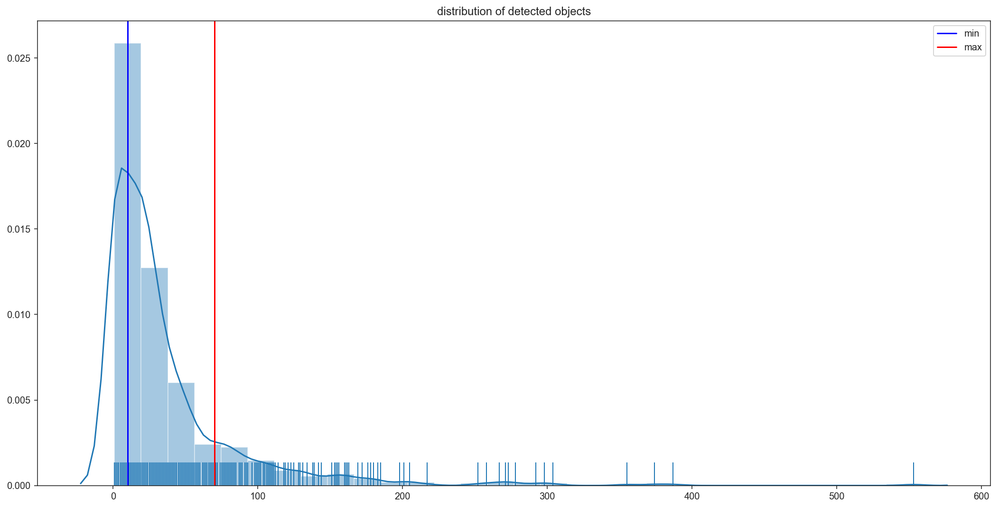

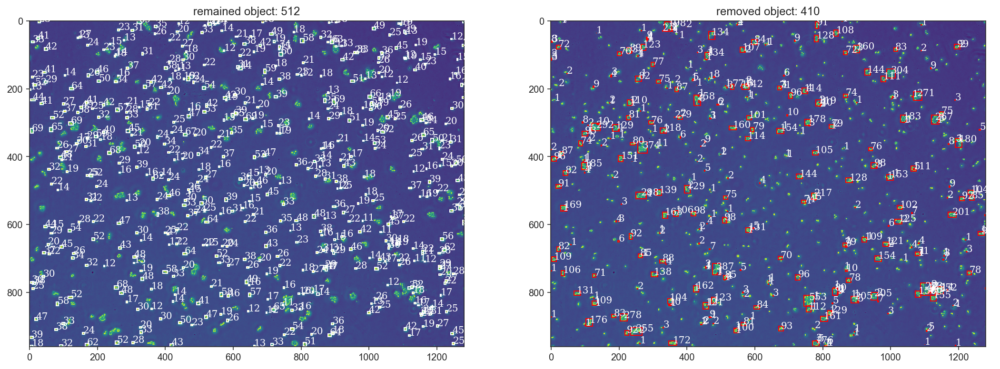

BF image: ./test_data/control2_bf.JPG
GFP image: ./test_data/control2_gfp.JPG


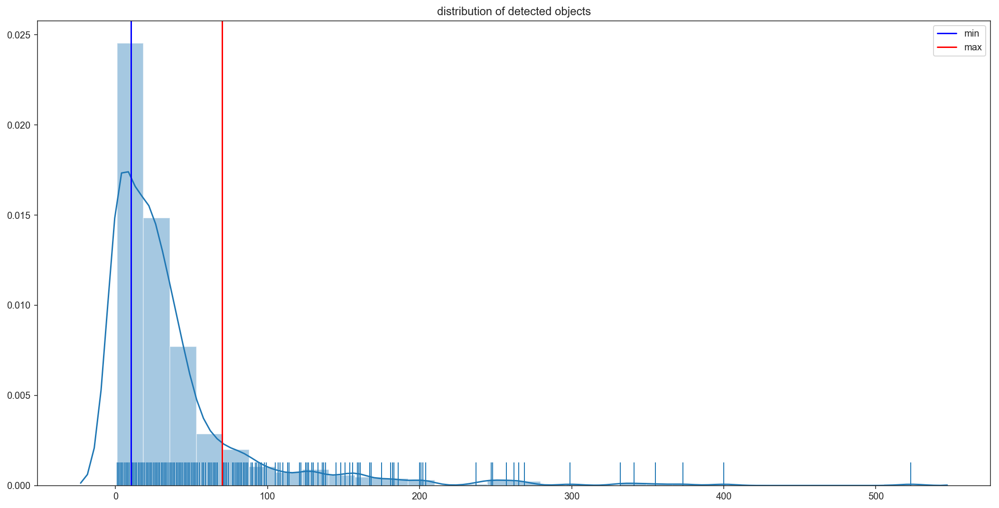

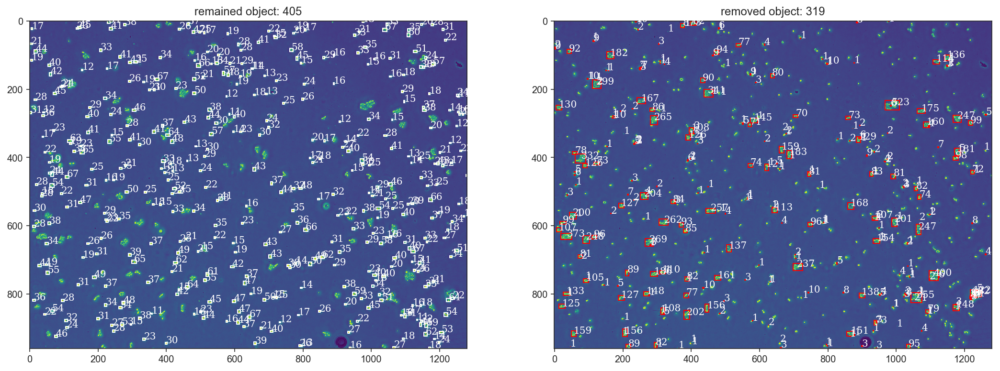

BF image: ./test_data/sample1_bf.JPG
GFP image: ./test_data/sample1_gfp.JPG


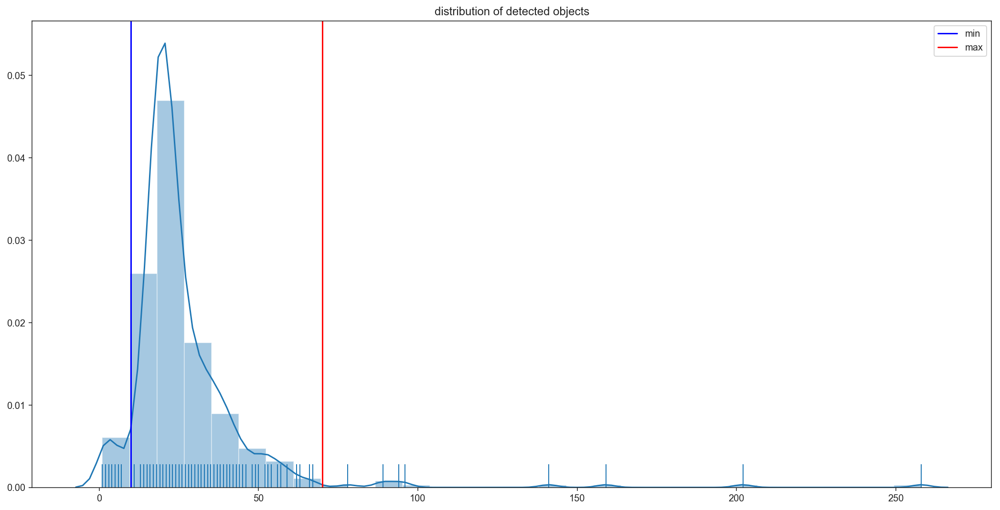

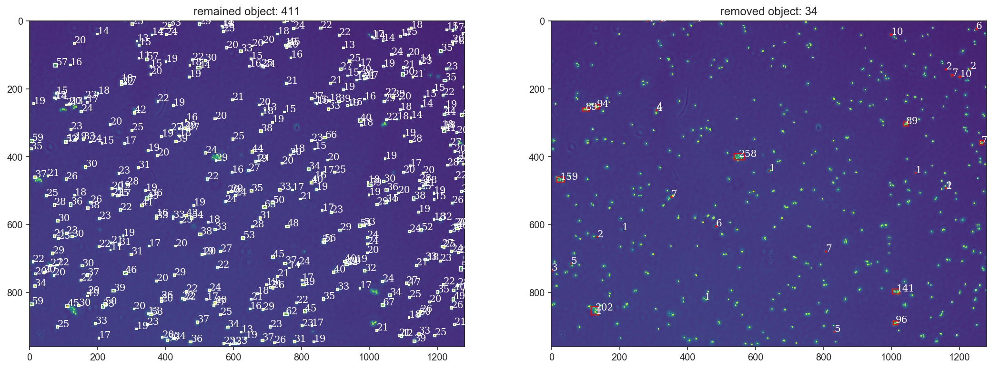

BF image: ./test_data/sample2_bf.JPG
GFP image: ./test_data/sample2_gfp.JPG


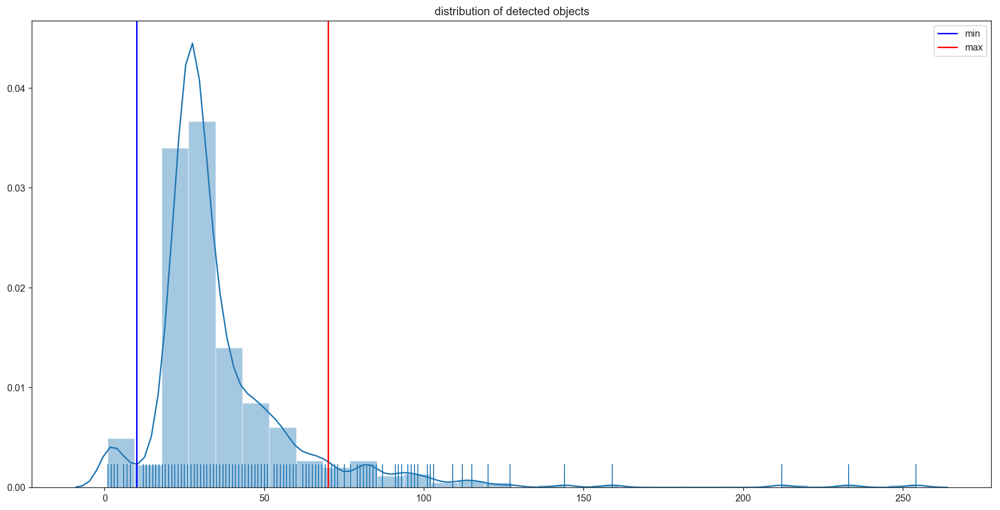

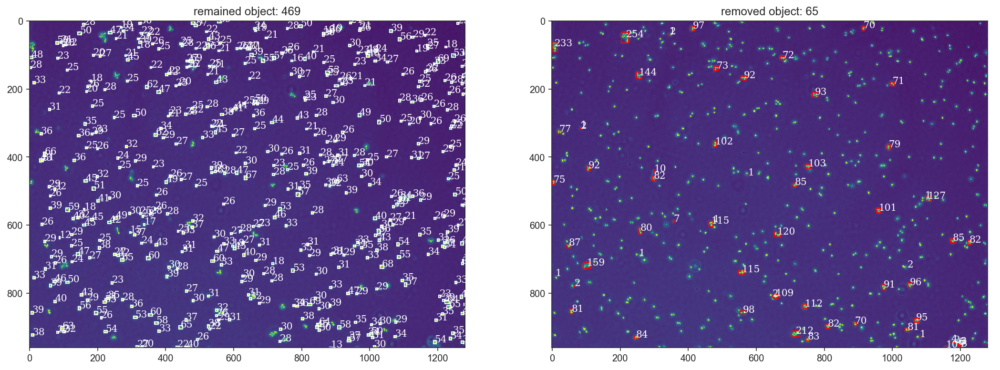

BF image: ./test_data/sample3_bf.JPG
GFP image: ./test_data/sample3_gfp.JPG


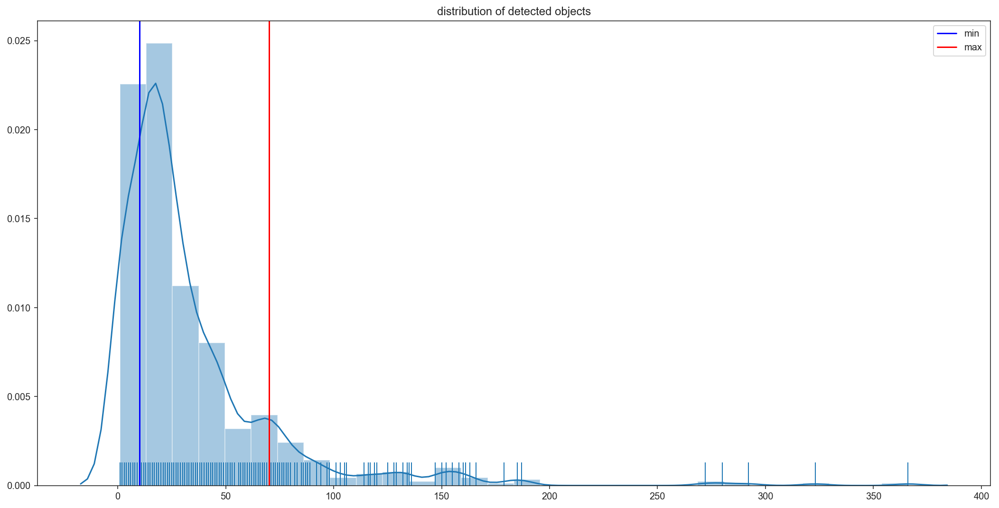

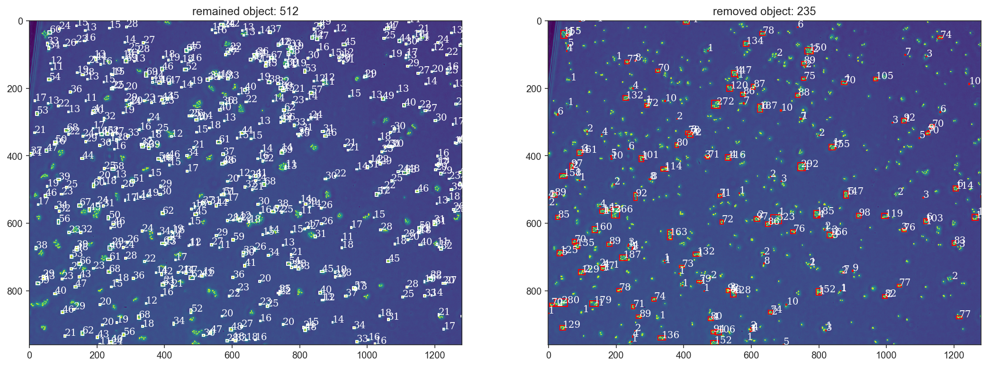

BF image: ./test_data/sample4_bf.JPG
GFP image: ./test_data/sample4_gfp.JPG


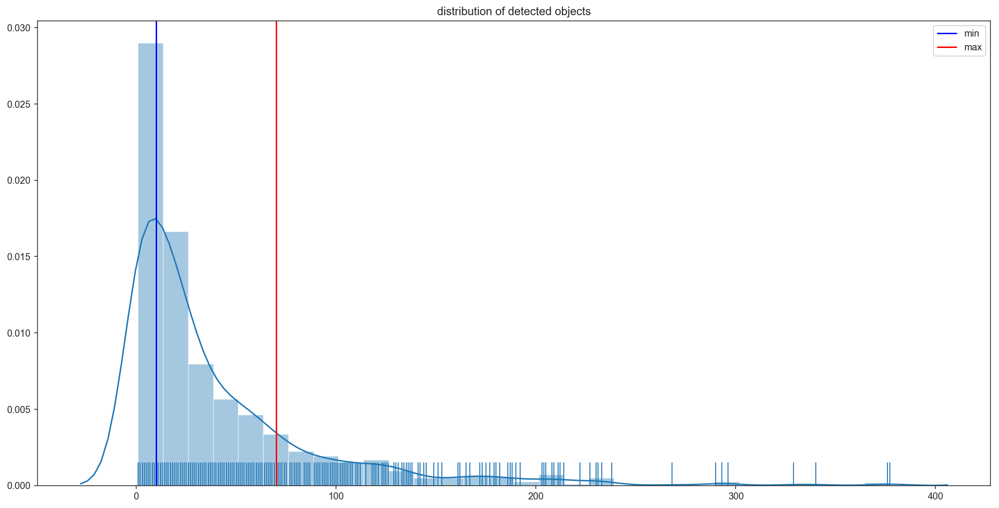

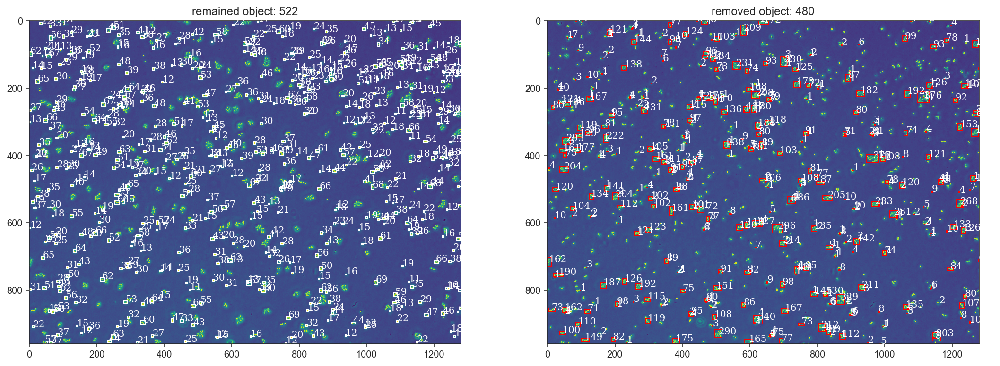

In [20]:
# process all images.

results = []
for BF_path, GFP_path in zip(BF_path_list, GFP_path_list):
    
    result = processAll(BF_path, GFP_path)
    
    results.append(result)

In [21]:
# merge all quantification results into one data frame
results = pd.concat(results, axis=0)
results.head()

,cordinates_y,cordinates_x,area,binarize_threshold_adjustment_otsu,binarize_threshold_value,green_mean_intensity,green_mean_intensity_log1p,segmentation_scale_factor,number_of_all_objects,cell_size_filter_min,cell_size_filter_max,number_of_removed_object,number_of_remained_object,file_path_BF,file_path_Green
0,1.782609,27.652174,23,0,0.49614,14.478261,2.739437,1,922,10,70,410,512,./test_data/control1_bf.JPG,./test_data/control1_gfp.JPG
2,2.710145,321.782609,69,0,0.49614,10.840580,2.471533,1,922,10,70,410,512,./test_data/control1_bf.JPG,./test_data/control1_gfp.JPG
3,2.166667,685.722222,18,0,0.49614,17.333333,2.908721,1,922,10,70,410,512,./test_data/control1_bf.JPG,./test_data/control1_gfp.JPG
5,1.611111,901.444444,18,0,0.49614,13.222222,2.654806,1,922,10,70,410,512,./test_data/control1_bf.JPG,./test_data/control1_gfp.JPG
6,2.360000,1277.240000,25,0,0.49614,13.040000,2.641910,1,922,10,70,410,512,./test_data/control1_bf.JPG,./test_data/control1_gfp.JPG


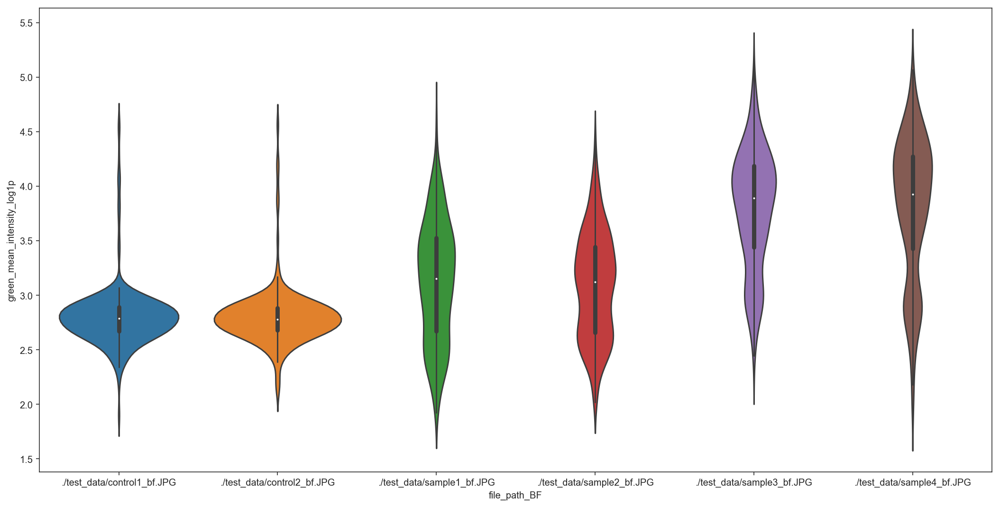

In [22]:
sns.violinplot(data=results, x="file_path_BF", y="green_mean_intensity_log1p")

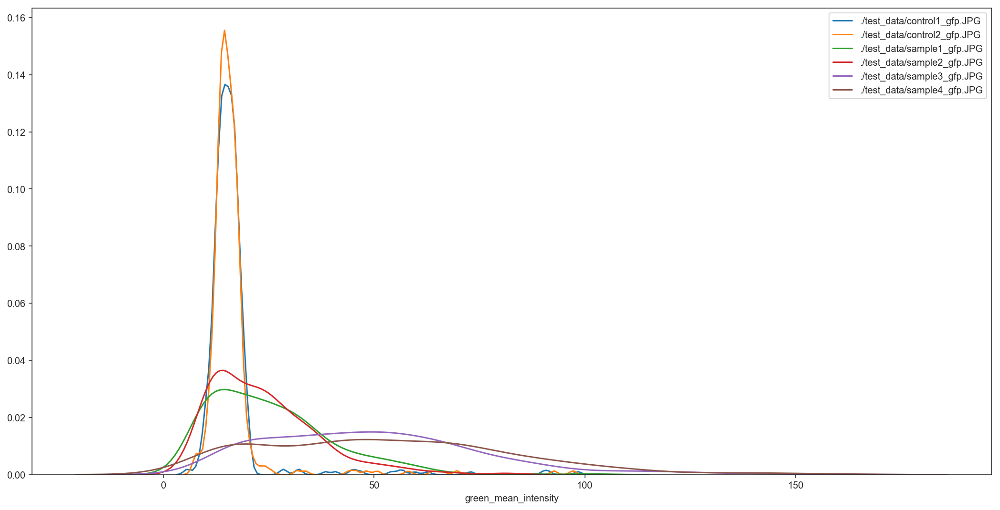

In [23]:
for i in results.file_path_Green.unique():
    
    tmp = results[results.file_path_Green==i]
    sns.distplot(tmp.green_mean_intensity, label=i, hist=False)
    #plt.xlim([0,100])
plt.legend() 
plt.show()

# 6. Estimate GFP positive ratio

Using GFP signal intensity distribution plot above, we can set threthold for GFP signal

In [24]:
threshold = 30

In [25]:
results["GFP_positive_cell"] = results.green_mean_intensity >= threshold
summary = results[["GFP_positive_cell", "file_path_Green"]].groupby("file_path_Green").mean()
summary.columns = ["GFP_positive_ratio"]
summary

,GFP_positive_ratio
file_path_Green,
./test_data/control1_gfp.JPG,0.031250
./test_data/control2_gfp.JPG,0.029630
./test_data/sample1_gfp.JPG,0.321168
./test_data/sample2_gfp.JPG,0.262260
./test_data/sample3_gfp.JPG,0.753906
./test_data/sample4_gfp.JPG,0.749042


In [26]:
# save results
results.to_csv("results.csv")
summary.to_csv("summary_GFP_positive_ratio.csv")